<a href="https://colab.research.google.com/github/rsarosh/ChangeFeedProcessorV2/blob/master/ResNet_Image_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import PIL
import tensorflow as tf
from tensorflow import keras
from keras import layers 
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
from keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.optimizers import RMSprop
import cv2
import os

In [2]:
img = image.load_img ("/content/drive/MyDrive/ML-Data/images/pepsi/train/yes/240517057_1189404561556920_5111115126840376670_n.jpg")
#plt.imshow (img)
cv2.imread ("/content/drive/MyDrive/ML-Data/images/pepsi/train/yes/240517057_1189404561556920_5111115126840376670_n.jpg").shape

(1080, 1080, 3)

In [3]:
img_height,img_width=180,180
batch_size=32

In [4]:
#
#train_dataset = tf.keras.preprocessing.image_dataset_from_directory(
#   '/content/drive/MyDrive/ML-Data/images/pepsi/train/',
  # Need this split if training and validation data both are in one directory, For us we dont need them
  #  validation_split=0.8, 
  #  subset="training",
#    seed=123,
#    label_mode = 'categorical', #without this line, model training does not work It should not be categorichal but Binary
#    image_size=(img_height, img_width),
#    batch_size=batch_size)


In [5]:
#print(train_dataset.class_names)

In [6]:
#load Validation Set
#validation_dataset = tf.keras.preprocessing.image_dataset_from_directory(
#    '/content/drive/MyDrive/ML-Data/images/pepsi/validate/',
    #Need this split if training and validation data both are in one directory, For us we dont need them
#  #  validation_split=0.2, 
#  #  subset="validation",
#    seed=123,
#    label_mode = 'categorical',
#    image_size=(img_height, img_width),
#    batch_size=batch_size)

In [7]:
#print(validation_dataset.class_names)
#class_names = validation_dataset.class_names

In [20]:
train_datagen = ImageDataGenerator(
      # rescale=1./255,
       rotation_range = 30,fill_mode='nearest',
       width_shift_range=0.2, height_shift_range=0.2,
       brightness_range=[0.4,1.5],
       shear_range=0.2,
       zoom_range=0.3,
       horizontal_flip=True
       )
data_dir = '/content/drive/MyDrive/ML-Data/images/pepsi/train/'
train_generator = train_datagen.flow_from_directory (data_dir, class_mode='categorical',target_size = (img_height, img_width), batch_size=batch_size, seed=2020 ) # to make the result reproducible

validation_datagen = ImageDataGenerator() #rescale=1./255 )
data_dir = '/content/drive/MyDrive/ML-Data/images/pepsi/validate/'
validation_generator = validation_datagen.flow_from_directory (data_dir, class_mode='categorical', target_size = (img_height, img_width), batch_size=batch_size, seed=2020 ) # to make the result reproducible

Found 1646 images belonging to 2 classes.
Found 571 images belonging to 2 classes.


In [21]:
print (validation_generator.class_indices )
class_keys = validation_generator.class_indices 
class_names = list(class_keys)
print (class_names)

{'No': 0, 'yes': 1}
['No', 'yes']


In [29]:
from keras import regularizers

# https://keras.io/api/applications/resnet/
no_classes = 2
pretrained_model= tf.keras.applications.ResNet50(
    # Do not include the ImageNet classifier at the top.
    include_top=False, # This ensures that we can add our own custom input and output layers according to our data.
    input_shape=(img_height,img_width,3),
    pooling='avg',classes=no_classes, #2 - for my test/ 5 for google
    weights='imagenet') #Resnet50 model will use the weights it learnt while being trained on the imagenet data.
#Setting layer.trainable to False moves all the layer's weights from trainable to non-trainable. This is called "freezing" the layer: the state of a frozen layer won't be updated during training (either when training with fit() or when training with any custom loop that relies on trainable_weights to apply gradient updates).
for layer in pretrained_model.layers:
        layer.trainable=False

model = Sequential()
model.add (pretrained_model)
#model.add(tf.keras.layers.Dropout (0.5)) # improving the efficiency by throwing away some of the neuron
model.add(tf.keras.layers.Flatten())                 
#Added Reularizers
model.add(tf.keras.layers.Dense(512, activation='relu', kernel_regularizer = regularizers.l2(0.01)))
model.add(tf.keras.layers.Dropout (0.5)) # improving the efficiency by throwing away some of the neuron
model.add(tf.keras.layers.Dense(no_classes, activation='sigmoid'))  #https://keras.io/api/applications/resnet/


In [ ]:
model.summary()

In [33]:
import datetime
%load_ext tensorboard

log_dir = "logs/ResNet/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


model.compile(optimizer=RMSprop(learning_rate=0.0001),loss='binary_crossentropy',metrics=['accuracy'])
#model.compile(optimizer=Adam(learning_rate=0.001),loss='categorical_crossentropy',metrics=['accuracy'])
#model.compile(optimizer=RMSprop (learning_rate=0.001),loss='binary_crossentropy',metrics=['accuracy'])
history = model.fit(train_generator, validation_data=validation_generator, epochs=15, callbacks=[tensorboard_callback]) #2.5 min per epoch

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Epoch 1/15
52/52 [==============================] - 375s 6s/step - loss: 6.6330 - accuracy: 0.7454 - val_loss: 6.0569 - val_accuracy: 0.8214
Epoch 2/15
52/52 [==============================] - 289s 6s/step - loss: 5.6996 - accuracy: 0.7843 - val_loss: 5.2595 - val_accuracy: 0.7951
Epoch 3/15
52/52 [==============================] - 271s 5s/step - loss: 4.9305 - accuracy: 0.8001 - val_loss: 4.5793 - val_accuracy: 0.7811
Epoch 4/15
52/52 [==============================] - 288s 6s/step - loss: 4.2461 - accuracy: 0.8104 - val_loss: 3.9414 - val_accuracy: 0.8214
Epoch 5/15
52/52 [==============================] - 273s 5s/step - loss: 3.7194 - accuracy: 0.8104 - val_loss: 3.4411 - val_accuracy: 0.8476
Epoch 6/15
52/52 [==============================] - 287s 6s/step - loss: 3.2596 - accuracy: 0.8250 - val_loss: 3.0654 - val_accuracy: 0.8354
Epoch 7/15
52/52 [==============================] - 288s 6s/step

In [27]:
#checkpoint_path = "/content/drive/MyDrive/ML-Data/Models/image_detection_curr_ckpt"
best_model_path = "/content/drive/MyDrive/ML-Data/Models/image_detection_model_ResNet.pt"
#save_ckp(checkpoint, False, checkpoint_path, best_model_path)
model.save(best_model_path)


INFO:tensorflow:Assets written to: /content/drive/MyDrive/ML-Data/Models/image_detection_model_ResNet.pt/assets


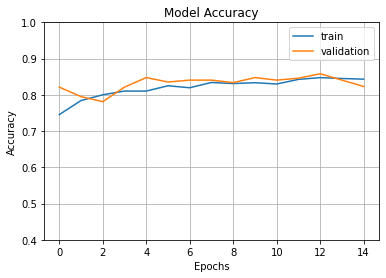

In [34]:
fig1 = plt.gcf()
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.axis(ymin=0.4,ymax=1)
plt.grid()
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['train', 'validation'])
plt.show()

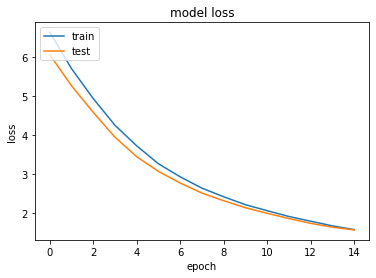

In [35]:
# summarize history for loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [36]:
%tensorboard --logdir logs/ResNet/fit/

<IPython.core.display.Javascript object>

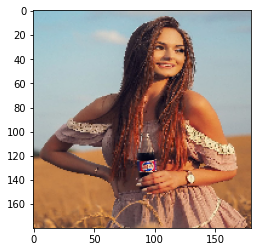

No pepsi


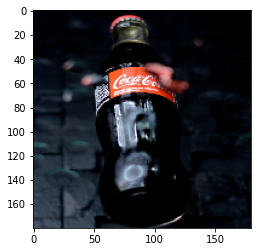

No pepsi


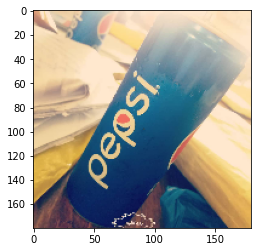

yes pepsi


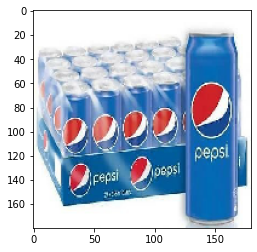

yes pepsi


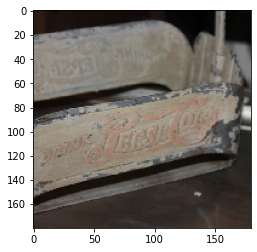

No pepsi


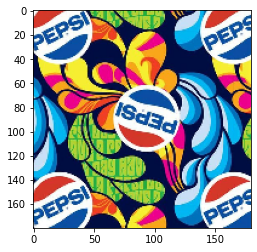

yes pepsi


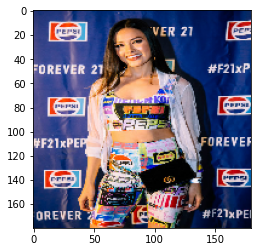

yes pepsi


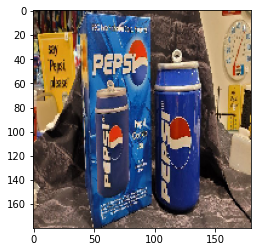

yes pepsi


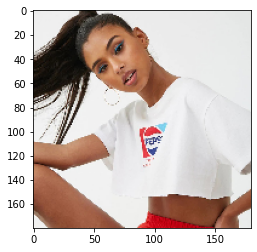

No pepsi


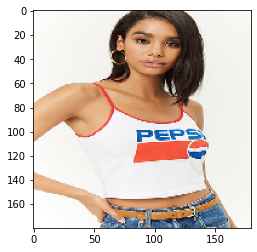

yes pepsi


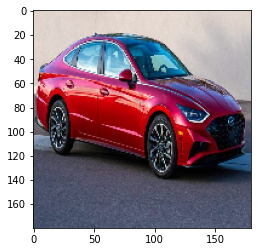

No pepsi


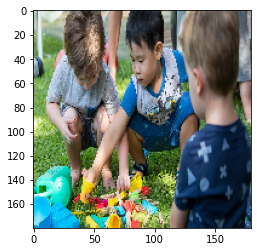

yes pepsi


In [38]:

loaded_model = tf.keras.models.load_model(best_model_path)
from keras.preprocessing import image
class bcolors:
    HEADER = '\033[95m'
    OKBLUE = '\033[94m'
    OKCYAN = '\033[96m'
    OKGREEN = '\033[92m'
    WARNING = '\033[93m'
    FAIL = '\033[91m'
    ENDC = '\033[0m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'


dir_path = '/content/drive/MyDrive/ML-Data/images/pepsi/test'
for i in os.listdir (dir_path):
  img = image.load_img( dir_path + '//' + i, target_size=(img_height,img_width))
  plt.imshow(img)
  plt.show()

  X = image.img_to_array (img)
  X = np.expand_dims (X, axis = 0)
  images = np.vstack([X])
  val = loaded_model.predict (images)
  output_class = class_names [np.argmax(val)]
  #print (val)
  if (output_class == 'yes'):
      print ( bcolors.BOLD + bcolors.OKGREEN + output_class + ' pepsi' + bcolors.ENDC)
  else :
      print ( bcolors.BOLD + bcolors.FAIL + output_class + ' pepsi' + bcolors.ENDC)

  

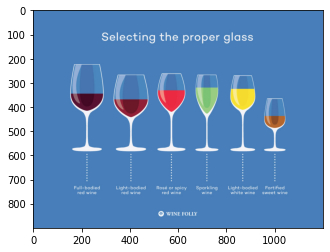

[[0.04247606 0.96356833]]
Pepsi?:  yes


In [39]:
import cv2
import urllib
from skimage import io

#loaded_model = tf.keras.models.load_model(best_model_path)

#test_image = io.imread('https://cdn.globalrose.com/assets/img/prod/roses-individually-wrapped-fundraiser-special-globalrose.png')
#test_image = io.imread('https://i5.walmartimages.com/asr/5be3694c-a758-481a-8839-e6471a19cafe.7564164012c3ffb6a33dbea5147dec03.jpeg?odnHeight=612&odnWidth=612&odnBg=FFFFFF')
#test_image = io.imread('https://hips.hearstapps.com/hmg-prod.s3.amazonaws.com/images/pepsi-x-peeps-easter-drink-1616678065.jpg?resize=980:*')
#test_image = io.imread('https://cdn.shopify.com/s/files/1/0575/9575/6709/products/WHITINGSHIRTMADRASNAVY-1_900x1200.jpg?v=1637326502')
#test_image = io.imread('https://domf5oio6qrcr.cloudfront.net/medialibrary/10992/b8b237ee-7cfe-4eab-b79b-dac389707899.jpg')
test_image = io.imread('https://media.winefolly.com/selecting-the-proper-wine-drink-glass.jpg') # Fail
#test_image = io.imread('https://img.fruugo.com/product/6/87/136146876_max.jpg')
#test_image = io.imread('https://cdn.gobankingrates.com/wp-content/uploads/2021/08/pepsico-facility-canada_iStock-1326187119.jpg?quality=75&w=800')
#test_image = io.imread('https://ww2.kqed.org/app/uploads/sites/10/2020/11/Alcatraz-Rose-1020x797.jpg')
#test_image = io.imread('https://mma.prnewswire.com/media/516624/PepsiCo_team_Las_Vegas.jpg')

plt.imshow(test_image)
plt.show()
#print('Original Dimensions : ',test_image.shape)
#image_resized= cv2.resize(image, (img_height,img_width))
dim = (img_width, img_height)
  
# resize image
image_resized = cv2.resize(test_image, dim, interpolation = cv2.INTER_AREA)
#print('Resized Dimensions : ',image_resized.shape)
image_resized = cv2.cvtColor(image_resized, cv2.COLOR_BGRA2BGR)  #Some images come with 4 channels
#print('Resized Dimensions : ',image_resized.shape)
image=np.expand_dims(image_resized,axis=0)

pred= loaded_model.predict(image)
print(pred)
output_class = class_names [np.argmax(pred)]
print("Pepsi?: ",   output_class )